# Setup

In [6]:
%%capture
%pip install wget tqdm kaggle librosa

Below is the kaggle API tool. For first time usage, refer to the [following highlight](https://www.kaggle.com/discussions/getting-started/524433#:~:text=install%20%2D%2Duser%20kaggle-,Authentication,sure%20the%20permissions%20are%20set%20correctly%20to%20keep%20the%20file%20secure.,-Interacting%20with%20Competitions) to get the public api `kaggle.json`



In [7]:
# !kaggle datasets download -d chandlertimm/librisevoc -p ./content --unzip

In [8]:
import os
import random
import librosa
from IPython.display import Audio

Here is the real voice dataset that we use

In [9]:
# Function to load and play audio
def play_audio(file_path):
    # Load the audio file
    audio_data, sample_rate = librosa.load(file_path, sr=None)

    # Print basic information about the file
    print(f"Now playing: {file_path}")
    print(f"Sample rate: {sample_rate}")
    print(f"Audio data shape: {audio_data.shape}")
    print(f"First 10 audio samples: {audio_data[:10]}")

    # Play the audio
    return Audio(audio_data, rate=sample_rate)

In [10]:
# Path to the directory containing the audio files
directory_path = 'content/LibriSeVoc/gt'

# Get a list of all .wav files in the directory
wav_files = [f for f in os.listdir(directory_path) if f.endswith('.wav')]

# Randomly select 10 files
random_files = random.sample(wav_files, 10)

# Loop through and play the 10 randomly selected audio files
for file in random_files:
    file_path = os.path.join(directory_path, file)
    display(play_audio(file_path))


AttributeError: module 'numba' has no attribute 'core'

Here is the fake voice dataset (diffwave) that we use

In [ ]:
# Path to the directory containing the wavenet audio files
directory_path = 'content/LibriSeVoc/diffwave'

# Get a list of all .wav files in the directory
wav_files = [f for f in os.listdir(directory_path) if f.endswith('.wav')]

# Randomly select 10 files
random_files = random.sample(wav_files, 10)

# Loop through and play the 10 randomly selected audio files
for file in random_files:
    file_path = os.path.join(directory_path, file)
    display(play_audio(file_path))


Now playing: content/LibriSeVoc/diffwave/8630_305212_000010_000004_gen.wav
Sample rate: 24000
Audio data shape: (142336,)
First 10 audio samples: [-0.00504065 -0.00114805 -0.00183439 -0.00186729 -0.00119311 -0.00045407
 -0.00028062  0.00025594  0.0005092   0.00052965]


Now playing: content/LibriSeVoc/diffwave/1963_142776_000050_000002_gen.wav
Sample rate: 24000
Audio data shape: (295680,)
First 10 audio samples: [ 0.00013375 -0.00234973 -0.00199062 -0.00209367 -0.00212079 -0.0021559
 -0.00282872 -0.00254697 -0.0023275  -0.00256771]


Now playing: content/LibriSeVoc/diffwave/3699_47246_000010_000000_gen.wav
Sample rate: 24000
Audio data shape: (153856,)
First 10 audio samples: [-0.00385892 -0.0034278  -0.00169361 -0.00154418 -0.00238532 -0.00186628
 -0.0019992  -0.00164199 -0.00141412 -0.00030041]


Now playing: content/LibriSeVoc/diffwave/4051_10927_000011_000001_gen.wav
Sample rate: 24000
Audio data shape: (219648,)
First 10 audio samples: [0.00044018 0.00118899 0.00102866 0.00206643 0.00136763 0.00164813
 0.00143081 0.00128591 0.00112325 0.00044364]


Now playing: content/LibriSeVoc/diffwave/696_93314_000005_000001_gen.wav
Sample rate: 24000
Audio data shape: (294656,)
First 10 audio samples: [ 0.00602931  0.00514174  0.00216353 -0.00036323  0.00077492  0.00113273
  0.00101113  0.00131077  0.00117874  0.00206441]


Now playing: content/LibriSeVoc/diffwave/6454_93938_000029_000000_gen.wav
Sample rate: 24000
Audio data shape: (384512,)
First 10 audio samples: [-3.38739157e-03 -3.66228819e-03 -9.92774963e-04 -5.66005707e-04
 -7.95602798e-04 -8.15987587e-05 -8.98838043e-05  9.05394554e-05
 -1.19924545e-04  1.29759312e-04]


Now playing: content/LibriSeVoc/diffwave/4051_10927_000029_000002_gen.wav
Sample rate: 24000
Audio data shape: (138752,)
First 10 audio samples: [ 0.00447029  0.0015406   0.00029129 -0.00018233 -0.0007813  -0.00045681
 -0.001293   -0.00123441 -0.00089073 -0.00176114]


Now playing: content/LibriSeVoc/diffwave/8468_286673_000020_000000_gen.wav
Sample rate: 24000
Audio data shape: (254464,)
First 10 audio samples: [-0.00061011 -0.00036347  0.00028491  0.00065452 -0.0001334  -0.00016439
 -0.00067949 -0.00054055  0.00029778 -0.00022674]


Now playing: content/LibriSeVoc/diffwave/3526_176653_000001_000007_gen.wav
Sample rate: 24000
Audio data shape: (315904,)
First 10 audio samples: [ 0.00225985 -0.0023486  -0.00165915 -0.00224078 -0.00106436 -0.00091362
 -0.00053209 -0.00026435 -0.00074953  0.00056517]


Now playing: content/LibriSeVoc/diffwave/3240_131232_000027_000001_gen.wav
Sample rate: 24000
Audio data shape: (376832,)
First 10 audio samples: [-1.6667247e-03 -1.2398958e-03 -1.0794997e-03 -7.7879429e-04
 -9.5945597e-04  2.2554398e-04 -6.1261654e-04  3.6007166e-04
  5.5968761e-05  4.4995546e-04]


# Data pre-processing
To avoid overfitting, we remove any non-verbal sound which might include environment noise, breathing, popping, etc. We also remove empty segments, normalise audio volume.

In [ ]:
%%capture
%pip install soundfile scipy numpy pandas matplotlib seaborn

In [ ]:
import soundfile as sf
from scipy.signal import butter, lfilter
import librosa.display
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import random
import seaborn as sns
import pickle

## Noise reduction

Getting RMS and dBFS
* `RMS` Root Mean Square, the electrical power signal that the audio creates overtime.
* `dBFS` decibels relative to full scale, 0 is the maximum value.

In [ ]:
import os
import pandas as pd
from tqdm import tqdm

# Define the output directory and file paths
output_dir = './output/'
file_paths_file = os.path.join(output_dir, 'file_paths.pkl')
sampling_rates_file = os.path.join(output_dir, 'sampling_rates.pkl')
rms_values_file = os.path.join(output_dir, 'rms_values.pkl')
dbfs_values_file = os.path.join(output_dir, 'dbfs_values.pkl')
labels_file = os.path.join(output_dir, 'labels.pkl')

# Check if the output directory exists, if not, create it
os.makedirs(output_dir, exist_ok=True)

# Function to read or initialize a list
def read_or_init_list(file_path):
    if os.path.exists(file_path):
        with open(file_path, 'rb') as f:
            return pickle.load(f)
    else:
        return []

# Save the lists back to the files
def save_list(file_path, data):
    with open(file_path, 'wb') as f:
        pickle.dump(data, f)

In [ ]:
# Initialize or read the lists
file_paths = read_or_init_list(file_paths_file)
sampling_rates = read_or_init_list(sampling_rates_file)
rms_values = read_or_init_list(rms_values_file)
dbfs_values = read_or_init_list(dbfs_values_file)
labels = read_or_init_list(labels_file)

In [ ]:
exclude_dirs = ['melgan', 'wavenet',"parallel_wave_gan","wavegrad","wavernn"]

data_dir = './content/LibriSeVoc'

def calculate_rms(y):
    """
    Calculate the Root Mean Square (RMS) value of an audio signal.

    :param y: raw audio signal (numpy array)
    :return: RMS value
    """
    return np.sqrt(np.mean(y**2))

def calculate_dbfs(y):
    """
    Calculate the dBFS (decibels relative to full scale) value of an audio signal.

    :param y: raw audio signal (numpy array)
    :return: dBFS value
    """
    rms = calculate_rms(y)
    dbfs = 20 * np.log10(rms + 1e-6)  # Add an infinitestimal to prevent log(0)
    return dbfs
if os.path.exists(file_paths_file) and \
    os.path.exists(sampling_rates_file) and \
        os.path.exists(rms_values_file) and \
            os.path.exists(dbfs_values_file) and \
                os.path.exists(labels_file):
    print(f"Files already exist in {output_dir}. Please delete the files to reprocess the data.")
else:
    try:
        for dirname, _, filenames in os.walk(data_dir):
            if any(exclude_dir in dirname for exclude_dir in exclude_dirs):
                continue
            for filename in tqdm(filenames, desc=f"Processing {dirname}"):
                if filename.lower().endswith('.wav'):
                    file_path = os.path.join(dirname, filename)
                    try:
                        y, sr = librosa.load(file_path, sr=None)

                        rms = calculate_rms(y)
                        dbfs = calculate_dbfs(y)

                        file_paths.append(file_path)
                        sampling_rates.append(sr)
                        rms_values.append(rms)
                        dbfs_values.append(dbfs)

                        if 'gt' in dirname.lower():
                            labels.append('real')
                        else:
                            labels.append('fake')
                        if len(sampling_rates) != len(rms_values) or \
                            len(dbfs_values) != len(rms_values) or \
                                len(labels) != len(dbfs_values):
                            raise Exception("Length of lists do not match.")
                    except Exception as e:
                        print(f"Error occurred {file_path}: {e}")
    except:
        print("Error occurred while processing files. Saving the current state.")

    save_list(file_paths_file, file_paths)
    save_list(sampling_rates_file, sampling_rates)
    save_list(rms_values_file, rms_values)
    save_list(dbfs_values_file, dbfs_values)
    save_list(labels_file, labels)

Files already exist in ./output/. Please delete the files to reprocess the data.


In [ ]:
len(file_paths), len(sampling_rates), len(rms_values), len(dbfs_values), len(labels)

(26402, 26402, 26402, 26402, 26402)

In [ ]:
df_audio = pd.DataFrame({
    'file_path': file_paths,
    'sampling_rate': sampling_rates,
    'rms': rms_values,
    'dbfs': dbfs_values,
    'label': labels
})

df_audio

,file_path,sampling_rate,rms,dbfs,label
0,./content/LibriSeVoc/gt/3857_180923_000008_000...,24000,0.061510,-24.220951,real
1,./content/LibriSeVoc/gt/426_122821_000035_0000...,24000,0.060355,-24.385653,real
2,./content/LibriSeVoc/gt/6081_41998_000029_0000...,24000,0.072021,-22.850687,real
3,./content/LibriSeVoc/gt/5322_7680_000032_00000...,24000,0.034738,-29.183571,real
4,./content/LibriSeVoc/gt/78_369_000026_000000.wav,24000,0.101507,-19.870003,real
...,...,...,...,...,...
26397,./content/LibriSeVoc/diffwave/3879_173592_0000...,24000,0.068184,-23.326223,fake
26398,./content/LibriSeVoc/diffwave/8095_274345_0000...,24000,0.060096,-24.422962,fake
26399,./content/LibriSeVoc/diffwave/7794_295948_0000...,24000,0.072218,-22.826923,fake
26400,./content/LibriSeVoc/diffwave/6209_34599_00000...,24000,0.079749,-21.965374,fake


In [ ]:
from utils import AudioFeatureExtractor

if not os.path.exists('output/data/df_audio.csv'):
    for idx, row in tqdm(df_audio.iterrows(), total=len(df_audio)):
        df_audio.at[idx, 'duration'] = AudioFeatureExtractor.get_audio_duration(row['file_path'])
    df_audio.to_csv('output/data/df_audio.csv', index=False)
else:
    df_audio = pd.read_csv('output/data/df_audio.csv')

In [ ]:
def plot_spectrogram(y, sr, title, ax=None):
    """
    Draw the Spectrogram of an audio signal.

    :param y: raw audio input (numpy array)
    :param sr: Sample rate (Hz)
    :param title: (String)
    :param ax: (optional)
    """

    D = librosa.stft(y, n_fft=2048, hop_length=512, window='hann')
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    img = librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz', cmap='magma', ax=ax)
    ax.set_title(title)
    fig = ax.get_figure()
    fig.colorbar(img, format='%+2.0f dB', ax=ax)

def plot_mel_spectrogram(y, sr, title, ax=None):
    """
    Draw the Mel Spectrogram of an audio signal.

    :param y: raw audio input (numpy array)
    :param sr: Sample rate (Hz)
    :param title: (String)
    :param ax: (optional)
    """

    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, n_fft=2048, hop_length=512)
    S_db = librosa.power_to_db(S, ref=np.max)

    img = librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', cmap='magma', ax=ax)
    ax.set_title(title)
    fig = ax.get_figure()
    fig.colorbar(img, format='%+2.0f dB', ax=ax)

    return ax

def plot_side_by_side_spectrogram(y1, sr1, y2, sr2, title1, title2):
    """
    Draw two Spectrograms side by side.

    :param y1: raw audio input 1 (numpy array)
    :param sr1: Sample rate 1 (Hz)
    :param y2: raw audio input 2 (numpy array)
    :param sr2: Sample rate 2 (Hz)
    :param title1: (String)
    :param title2: (String)
    """
    plt.figure(figsize=(20, 8))

    # First spectrogram
    plt.subplot(1, 2, 1)
    plot_spectrogram(y1, sr1, title1)

    # Second spectrogram
    plt.subplot(1, 2, 2)
    plot_spectrogram(y2, sr2, title2)

    plt.tight_layout()
    plt.show()

In [ ]:
df_audio['base_name'] = df_audio['file_path'].apply(lambda x: os.path.splitext(os.path.basename(x))[0].replace('_gen', ''))

df_real = df_audio[df_audio['label'] == 'real'].copy()
df_fake = df_audio[df_audio['label'] == 'fake'].copy()

df_pairs = pd.merge(df_real, df_fake, on='base_name', suffixes=('_real', '_fake'))

num_total_pairs = len(df_pairs)
print(f"Real-Fake pairs: {num_total_pairs}")

Real-Fake pairs: 13201


Sample spectrogram and Mel spectrogram

In [ ]:
plot_dir = './output/plots'

                   base_name  \
0  3857_180923_000008_000000   

                                      file_path_real  \
0  ./content/LibriSeVoc/gt/3857_180923_000008_000...   

                                      file_path_fake  
0  ./content/LibriSeVoc/diffwave/3857_180923_0000...  


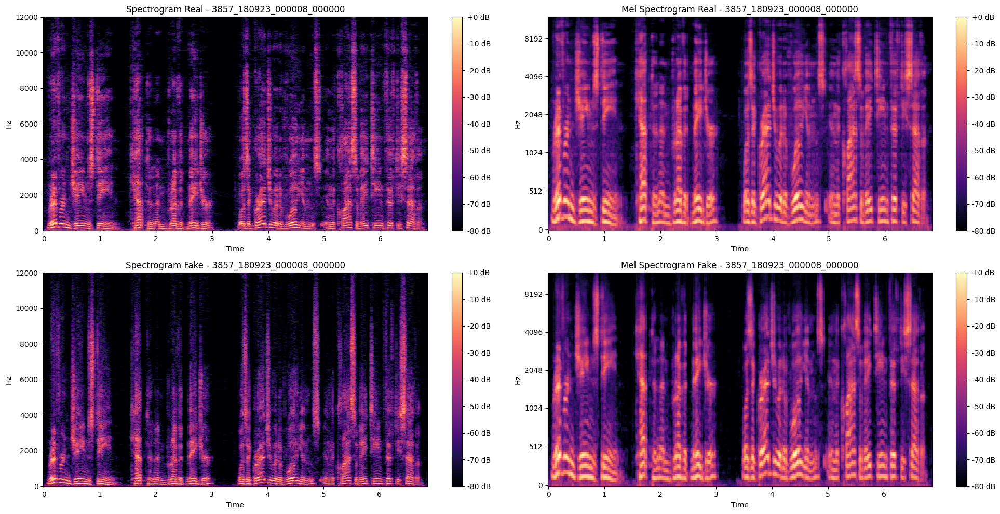

Real voice


Fake voice


In [ ]:

num_pairs_to_select = 1
if num_total_pairs < num_pairs_to_select:
    print(f"There are only {num_total_pairs} pairs.")
    selected_pairs = df_pairs
else:
    selected_pairs = df_pairs.head(num_pairs_to_select)
print(selected_pairs[['base_name', 'file_path_real', 'file_path_fake']])

for idx, row in selected_pairs.iterrows():
    real_path = row['file_path_real']
    fake_path = row['file_path_fake']
    base_name = row['base_name']

    try:
        # Declaration
        y_real, sr_real = librosa.load(real_path, sr=None)
        y_fake, sr_fake = librosa.load(fake_path, sr=None)

        # Normalize the audio signals
        y_real = librosa.util.normalize(y_real)
        y_fake = librosa.util.normalize(y_fake)

        # Plot the Spectrograms
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

        # Plotting real
        plot_spectrogram(y_real, sr_real, f"Spectrogram Real - {base_name}", ax=axes[0,0])
        plot_mel_spectrogram(y_real, sr_real, f"Mel Spectrogram Real - {base_name}", ax=axes[0,1])
        # Plotting fake
        plot_spectrogram(y_fake, sr_fake, f"Spectrogram Fake - {base_name}", ax=axes[1,0])
        plot_mel_spectrogram(y_fake, sr_fake, f"Mel Spectrogram Fake - {base_name}", ax=axes[1,1])

        plt.tight_layout()

        # Save the plot
        output_plot_path = f'{plot_dir}/{base_name}_spectrograms.png'
        fig.savefig(output_plot_path)

        # Show the plot
        plt.show()

        print("Real voice")
        display(Audio(data=y_real, rate=sr_real))
        print("Fake voice")
        display(Audio(data=y_fake, rate=sr_fake))

    except Exception as e:
        print(f"Error {base_name}: {e}")

All audio files have the same sampling rate.


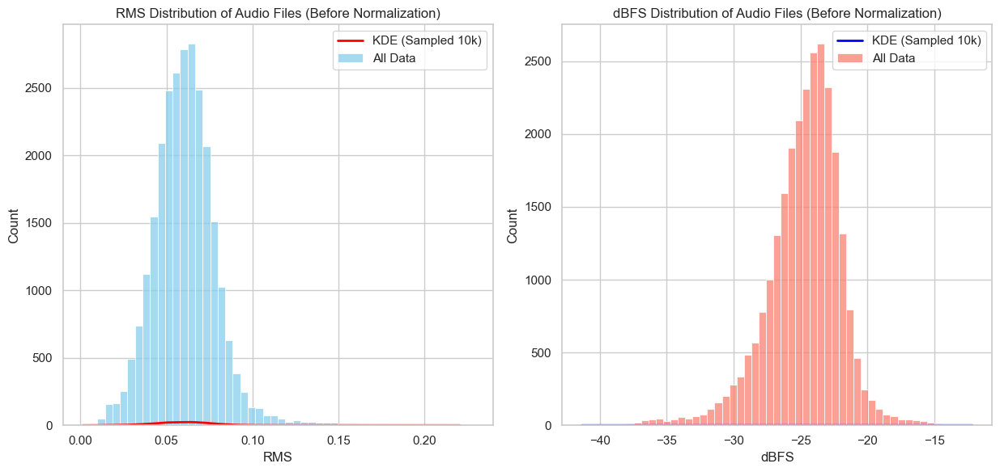

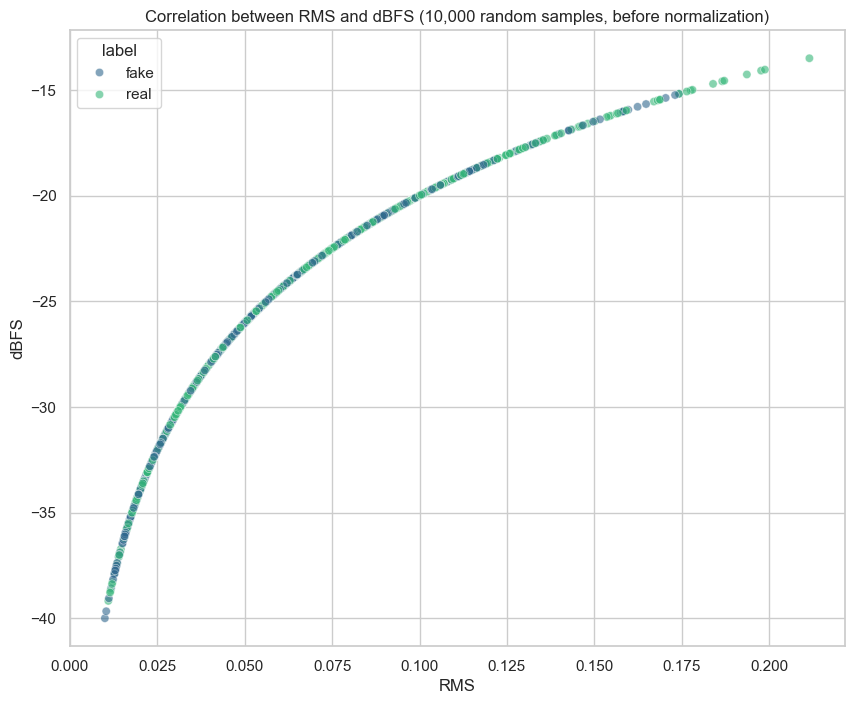

In [ ]:
sns.set(style="whitegrid")
plt.figure(figsize=(18, 6))

# Check unique sampling rates
unique_sampling_rates = df_audio['sampling_rate'].unique()
if len(unique_sampling_rates) > 1:
    print(f'There are {len(unique_sampling_rates)} unique sampling rates')
else:
    print("All audio files have the same sampling rate.")

# RMS Distribution
plt.subplot(1, 3, 2)
df_rms_sample = df_audio['rms'].sample(n=10000, random_state=42)
sns.histplot(df_audio['rms'], bins=50, color='skyblue', label='All Data', stat='count', kde=False)
sns.kdeplot(df_rms_sample, color='red', label='KDE (Sampled 10k)', linewidth=2)
plt.title('RMS Distribution of Audio Files (Before Normalization)')
plt.xlabel('RMS')
plt.legend()

# dBFS Distribution
plt.subplot(1, 3, 3)
df_dbfs_sample = df_audio['dbfs'].sample(n=10000, random_state=42)
sns.histplot(df_audio['dbfs'], bins=50, color='salmon', label='All Data', stat='count', kde=False)
sns.kdeplot(df_dbfs_sample, color='blue', label='KDE (Sampled 10k)', linewidth=2)
plt.title('dBFS Distribution of Audio Files (Before Normalization)')
plt.xlabel('dBFS')
plt.legend()

plt.tight_layout()
plt.savefig(f'{plot_dir}/audio_data_distribution.png')
plt.show()

df_sample = df_audio.sample(n=10000, random_state=42)

plt.figure(figsize=(10, 8))
sns.scatterplot(x='rms', y='dbfs', hue='label', data=df_sample, palette='viridis', alpha=0.6)
plt.title('Correlation between RMS and dBFS (10,000 random samples, before normalization)')
plt.xlabel('RMS')
plt.ylabel('dBFS')
plt.savefig(f'{plot_dir}/rms_dbfs_before_norm.png')
plt.show()



dBFS and RMS has a logarithmic correlation

To ensure consistency, we must ensure that all files have the same sample rate. In this dataset, all audio are sampled at 24kHz.

In [ ]:
df_audio['duration'].unique()

array([ 6.84      ,  6.07      , 11.68      , ..., 26.67733333,
       21.728     , 17.29066667])

Audio processing functions

Remove noise from lowcut=300.0 HZ to highcut=3400.0HZ

In [ ]:
from utils import AudioPreprocessor, AudioAugmentation

Real: pre-processed


Real: post-processed


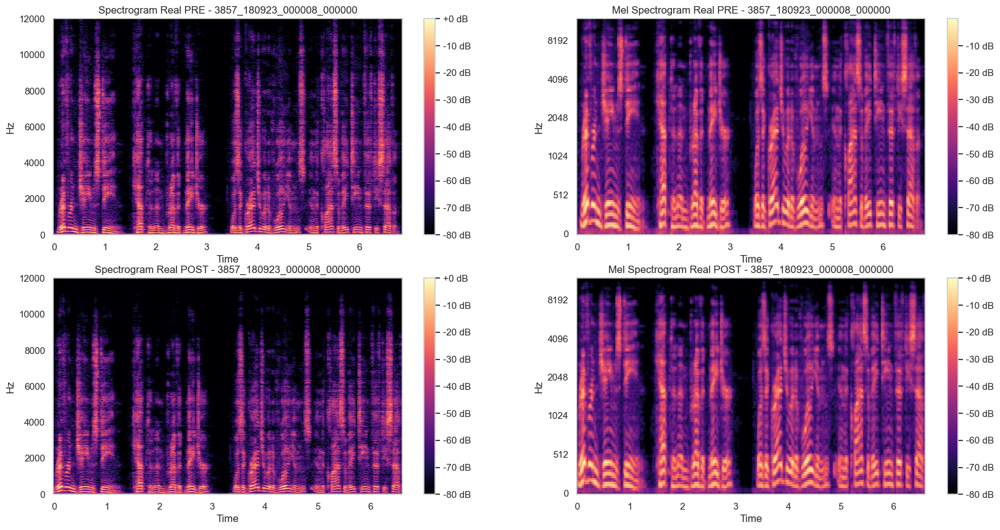

Fake: pre-processed


Fake: post-processed


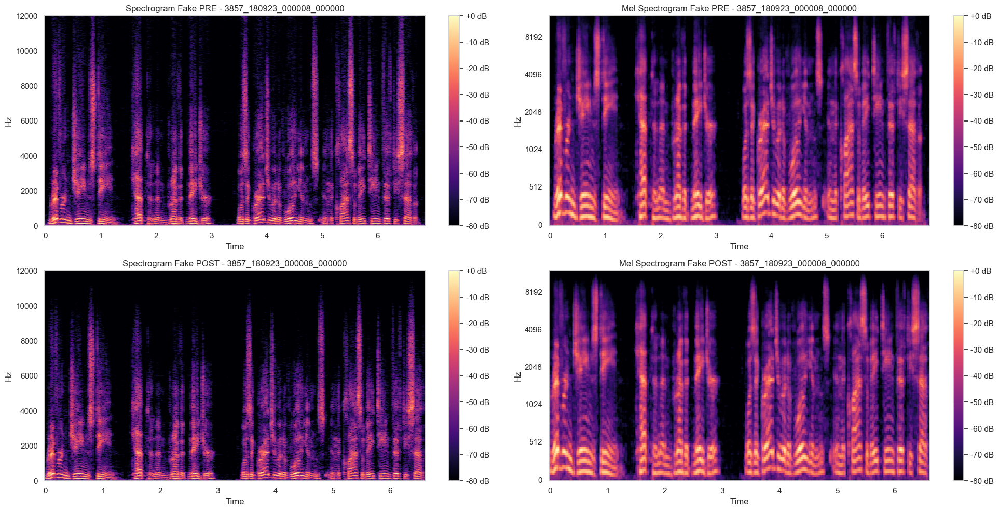

In [ ]:
for idx, row in selected_pairs.iterrows():
    real_path = row['file_path_real']
    fake_path = row['file_path_fake']
    base_name = row['base_name']

    # Real audio

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
    y_real, sr_real = librosa.load(real_path, sr=None)
    print("Real: pre-processed")
    display(Audio(data=y_real, rate=sr_real))
    plot_spectrogram(y_real, sr_real, f"Spectrogram Real PRE - {base_name}", ax=axes[0,0])
    plot_mel_spectrogram(y_real, sr_real, f"Mel Spectrogram Real PRE - {base_name}", ax=axes[0,1])

    y_real = AudioPreprocessor.remove_silence(y_real, sr_real, top_db=20)
    y_real = AudioPreprocessor.bandpass_filter(y_real, sr_real, lowcut=100, highcut=6000, order=1)  # From 300Hz to 3400Hz
    y_real = AudioAugmentation.add_noise(y_real)
    print("Real: post-processed")
    display(Audio(data=y_real, rate=sr_real))

    plot_spectrogram(y_real, sr_real, f"Spectrogram Real POST - {base_name}", ax=axes[1,0])
    plot_mel_spectrogram(y_real, sr_real, f"Mel Spectrogram Real POST - {base_name}", ax=axes[1,1])
    plt.show()

    # Fake audio
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
    y_fake, sr_fake = librosa.load(fake_path, sr=None)
    print("Fake: pre-processed")
    display(Audio(data=y_fake, rate=sr_fake))
    plot_spectrogram(y_fake, sr_fake, f"Spectrogram Fake PRE - {base_name}", ax=axes[0,0])
    plot_mel_spectrogram(y_fake, sr_fake, f"Mel Spectrogram Fake PRE - {base_name}", ax=axes[0,1])

    y_fake = AudioPreprocessor.remove_silence(y_fake, sr_fake, top_db=20)
    y_fake = AudioPreprocessor.bandpass_filter(y_fake, sr_fake, lowcut=100, highcut=6000, order=1)
    print("Fake: post-processed")
    display(Audio(data=y_fake, rate=sr_fake))

    plot_spectrogram(y_fake, sr_fake, f"Spectrogram Fake POST - {base_name}", ax=axes[1,0])
    plot_mel_spectrogram(y_fake, sr_fake, f"Mel Spectrogram Fake POST - {base_name}", ax=axes[1,1])
    plt.tight_layout()
    plt.show()

Pre-processed Real


Post-processed Real


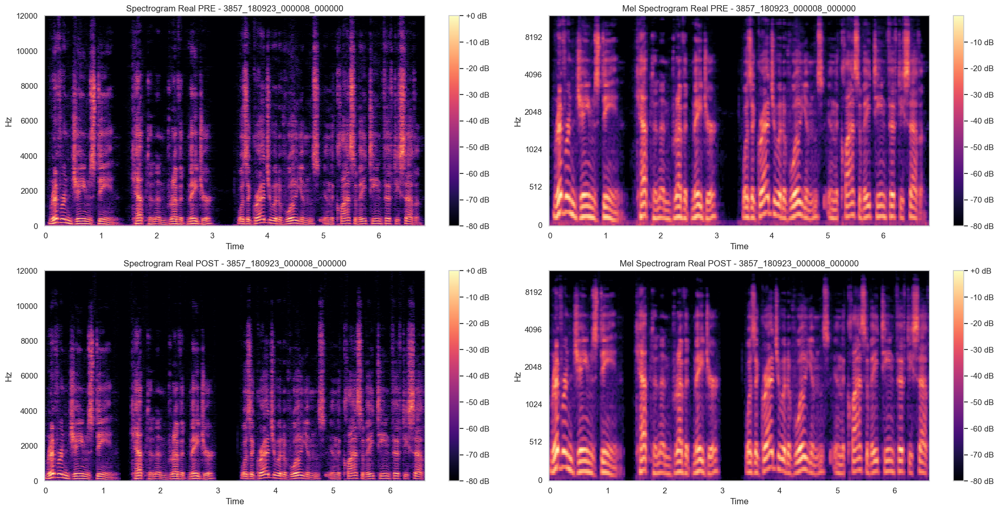

Pre-processed Fake


Post-processed Fake


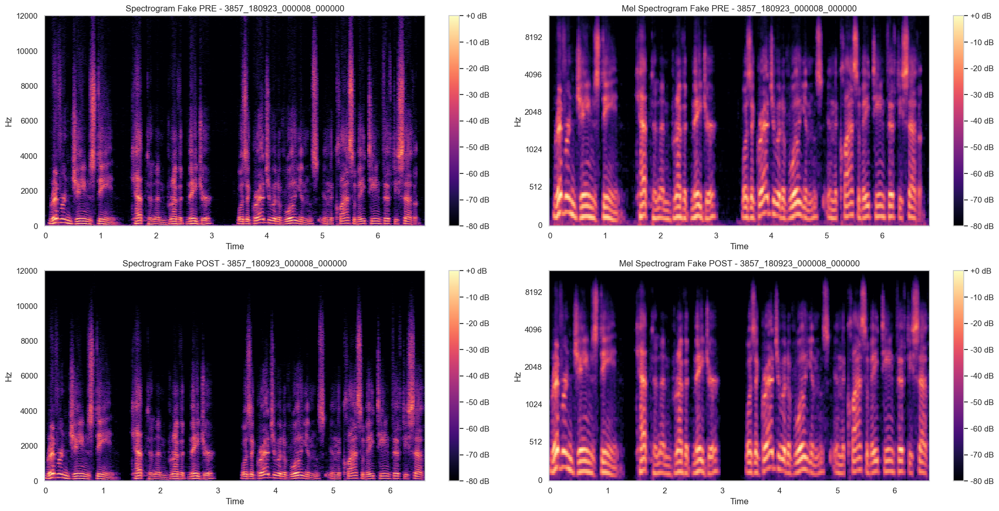

In [ ]:
for idx, row in selected_pairs.iterrows():
    real_path = row['file_path_real']
    fake_path = row['file_path_fake']
    base_name = row['base_name']

    try:
        # -------------------------
        # Real
        # -------------------------
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
        y_real, sr_real = librosa.load(real_path, sr=None)
        print("Pre-processed Real")
        display(Audio(data=y_real, rate=sr_real))

        plot_spectrogram(y_real, sr_real, f"Spectrogram Real PRE - {base_name}", ax=axes[0,0])
        plot_mel_spectrogram(y_real, sr_real, f"Mel Spectrogram Real PRE - {base_name}", ax=axes[0,1])

        y_real = remove_silence(y_real, sr_real, top_db=20)
        y_real = bandpass_filter(y_real, sr_real, lowcut=200, highcut=4000, order=1)  # Ví dụ dải tần từ 300Hz đến 3400Hz
        y_real = 
        y_real_cut = decrease_low_db(y_real, sr_real, threshold_db=-50)
        print("Post-processed Real")
        display(Audio(data=y_real, rate=sr_real))

        plot_spectrogram(y_real_cut, sr_real, f"Spectrogram Real POST - {base_name}", ax=axes[1,0])
        plot_mel_spectrogram(y_real_cut, sr_real, f"Mel Spectrogram Real POST - {base_name}", ax=axes[1,1])

        plt.tight_layout()
        plt.show()

        # -------------------------
        # Fake
        # -------------------------
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
        y_fake, sr_fake = librosa.load(fake_path, sr=None)
        print("Pre-processed Fake")
        display(Audio(data=y_real, rate=sr_real))

        plot_spectrogram(y_fake, sr_fake, f"Spectrogram Fake PRE - {base_name}", ax=axes[0,0])
        plot_mel_spectrogram(y_fake, sr_fake, f"Mel Spectrogram Fake PRE - {base_name}", ax=axes[0,1])

        y_fake = remove_silence(y_fake, sr_fake, top_db=20)
        y_fake = bandpass_filter(y_fake, sr_fake, lowcut=200, highcut=4000, order=1)
        y_fake_cut = decrease_low_db(y_fake, sr_fake, threshold_db=-55)
        print("Post-processed Fake")
        display(Audio(data=y_real, rate=sr_real))


        plot_spectrogram(y_fake_cut, sr_fake, f"Spectrogram Fake POST - {base_name}", ax=axes[1,0])
        plot_mel_spectrogram(y_fake_cut, sr_fake, f"Mel Spectrogram Fake POST - {base_name}", ax=axes[1,1])

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error {base_name}: {e}")

# Feature extraction

In [ ]:
%%capture
%pip install opensmile spafe

In [ ]:
%load_ext autoreload
%reload_ext autoreload

In [ ]:
from utils import process_audio_files
import pandas as pd

In [ ]:
process_audio_files(file_paths, labels, output_csv='./output/data/features.csv',\
                    n_mfcc=30, resume=True, force_new=False, augment_data=True, snapshot_interval=1000, augment_split=0.3)

Data augmentation is set to True.


Processing audio files:   0%|          | 0/26402 [00:00<?, ?it/s]

File has been processed before: ./content/LibriSeVoc/gt/3857_180923_000008_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/426_122821_000035_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/6081_41998_000029_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/5322_7680_000032_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/78_369_000026_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/39_121915_000013_000003.wav


Processing audio files:   0%|          | 12/26402 [00:00<03:50, 114.63it/s]

File has been processed before: ./content/LibriSeVoc/gt/8465_246947_000003_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/6818_76332_000022_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/4788_94904_000006_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/8838_298546_000023_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/1867_154075_000053_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/7367_86737_000119_000012.wav
File has been processed before: ./content/LibriSeVoc/gt/1841_150351_000003_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/6818_76332_000033_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/27_124992_000021_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/7067_76047_000031_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/2136_5140_000005_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/8324_28

Processing audio files:   0%|          | 25/26402 [00:00<03:43, 118.01it/s]

File has been processed before: ./content/LibriSeVoc/gt/8975_270782_000010_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/1502_122619_000063_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/5703_47212_000043_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/2136_5140_000023_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/831_130739_000010_000008.wav
File has been processed before: ./content/LibriSeVoc/gt/4813_248641_000015_000000.wav


Processing audio files:   0%|          | 49/26402 [00:00<03:44, 117.14it/s]

File has been processed before: ./content/LibriSeVoc/gt/7067_76047_000017_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/5808_54425_000029_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/6272_70171_000027_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/1502_122615_000038_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/4160_11550_000009_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/1246_124548_000018_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/1502_122615_000029_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/40_222_000041_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/250_142286_000011_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/87_121553_000145_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/8630_305213_000012_000005.wav
File has been processed before: ./content/LibriSeVoc/gt/32_4137_00

Processing audio files:   0%|          | 75/26402 [00:00<03:39, 119.84it/s]

File has been processed before: ./content/LibriSeVoc/gt/4406_16882_000007_000004.wav
File has been processed before: ./content/LibriSeVoc/gt/5393_19218_000033_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/3664_11714_000019_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/8312_279791_000039_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/3857_182315_000018_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/5514_19192_000006_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/730_360_000005_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/5163_18515_000042_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/5322_7679_000026_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/6880_216547_000015_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/6385_34655_000016_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/5163_18515

Processing audio files:   0%|          | 99/26402 [00:00<03:44, 117.00it/s]


File has been processed before: ./content/LibriSeVoc/gt/1624_142933_000020_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/196_122150_000003_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/6367_65536_000003_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/7635_105409_000110_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/196_122150_000012_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/8580_287363_000022_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/226_122538_000021_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/3879_174923_000026_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/5561_41615_000027_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/5561_41615_000036_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/374_180298_000009_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/6209

Processing audio files:   1%|          | 135/26402 [00:01<03:43, 117.40it/s]

File has been processed before: ./content/LibriSeVoc/gt/8797_294123_000006_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/6064_56168_000027_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/730_358_000006_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/1183_128659_000047_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/6064_300880_000049_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/125_121124_000054_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/7078_271888_000009_000006.wav
File has been processed before: ./content/LibriSeVoc/gt/250_142276_000003_000013.wav
File has been processed before: ./content/LibriSeVoc/gt/7059_77900_000032_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/2092_145706_000039_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/4640_19187_000030_000008.wav
File has been processed before: ./content/LibriSeVoc/gt/6181_21

Processing audio files:   1%|          | 160/26402 [00:01<03:40, 119.27it/s]

File has been processed before: ./content/LibriSeVoc/gt/40_121026_000239_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/1334_135589_000058_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/7780_274562_000013_000005.wav
File has been processed before: ./content/LibriSeVoc/gt/40_121026_000176_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/6272_70168_000010_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/3436_172162_000011_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/7447_91186_000027_000005.wav
File has been processed before: ./content/LibriSeVoc/gt/7505_258964_000032_000004.wav
File has been processed before: ./content/LibriSeVoc/gt/2002_139469_000012_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/27_123349_000011_000007.wav
File has been processed before: ./content/LibriSeVoc/gt/3699_19401_000049_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/5393_19

Processing audio files:   1%|          | 186/26402 [00:01<03:36, 120.88it/s]

File has been processed before: ./content/LibriSeVoc/gt/1355_39947_000002_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/6476_57446_000018_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/1841_179183_000021_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/7505_83618_000015_000005.wav
File has been processed before: ./content/LibriSeVoc/gt/2416_152139_000061_000007.wav
File has been processed before: ./content/LibriSeVoc/gt/2836_5355_000063_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/3240_131232_000057_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/8098_278278_000019_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/3436_172171_000009_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/7447_91187_000010_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/7505_258964_000005_000004.wav
File has been processed before: ./content/LibriSeVoc/gt/87_1

Processing audio files:   1%|          | 219/26402 [00:01<03:42, 117.51it/s]

File has been processed before: ./content/LibriSeVoc/gt/3857_182317_000025_000004.wav
File has been processed before: ./content/LibriSeVoc/gt/78_369_000058_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/3699_19402_000016_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/5867_48852_000035_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/412_126975_000042_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/200_126784_000084_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/2092_145706_000003_000001.wav
File has been processed before: ./content/LibriSeVoc/gt/2092_145706_000012_000003.wav
File has been processed before: ./content/LibriSeVoc/gt/446_123501_000016_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/460_172359_000064_000002.wav
File has been processed before: ./content/LibriSeVoc/gt/3526_176653_000034_000000.wav
File has been processed before: ./content/LibriSeVoc/gt/460_17235

KeyboardInterrupt: 

In [ ]:
flac_directory_path = './content/ASVspoof2021/ASVspoof2021_DF_eval/flac'

# Get a list of all .flac files in the directory
flac_files = [os.path.join(flac_directory_path, f) for f in os.listdir(flac_directory_path) if f.endswith('.flac')]

In [ ]:
# Path to the metadata file
metadata_file_path = 'content/ASVspoof2021/keys/DF/CM/trial_metadata.txt'

# Read the file and split each line by spaces
with open(metadata_file_path, 'r') as file:
    metadata_lines = [line.strip().split() for line in file]

# Display the first few lines to verify
# Create a dataframe from the metadata
df_metadata = pd.DataFrame(metadata_lines, columns=['name', 'file_name', 'codec', 'database', 'system_id', 'label', 'trim', 'subset', 'method', 'task', 'team', 'gender', 'accent'])

# Select only the 'file_id' and 'label' columns
df_metadata = df_metadata[['file_name', 'label']]

# Display the first few rows of the dataframe
df_metadata['label'] = df_metadata['label'].replace({'spoof': 'fake', 'bonafide': 'real'})
# Filter the metadata to include only rows with file_name present in flac_files
df_metadata = df_metadata[df_metadata['file_name'].isin([os.path.splitext(os.path.basename(f))[0] for f in flac_files])]

df_metadata = df_metadata[df_metadata['file_name'].isin([os.path.splitext(os.path.basename(f))[0] for f in flac_files])]

# Add a new column with the full path
df_metadata['file_path'] = df_metadata['file_name'].apply(lambda x: os.path.join(flac_directory_path, f"{x}.flac"))

In [ ]:
df_metadata.head()

,file_name,label,file_path
0,DF_E_2000011,fake,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...
1,DF_E_2000013,fake,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...
2,DF_E_2000024,fake,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...
3,DF_E_2000026,fake,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...
4,DF_E_2000027,fake,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...


In [ ]:
# Count the number of real and fake samples
real_count = df_metadata[df_metadata['label'] == 'real'].shape[0]
fake_count = df_metadata[df_metadata['label'] == 'fake'].shape[0]

# Determine the smaller class size
min_count = min(real_count, fake_count)

# Sample the larger class to match the smaller class size
if real_count > fake_count:
    df_real_sampled = df_metadata[df_metadata['label'] == 'real'].sample(n=min_count, random_state=42)
    df_fake_sampled = df_metadata[df_metadata['label'] == 'fake']
else:
    df_real_sampled = df_metadata[df_metadata['label'] == 'real']
    df_fake_sampled = df_metadata[df_metadata['label'] == 'fake'].sample(n=min_count, random_state=42)

# Concatenate the sampled dataframes
df_balanced = pd.concat([df_real_sampled, df_fake_sampled]).reset_index(drop=True)

# Display the balanced dataframe
df_balanced.label.value_counts()

label
real    5535
fake    5535
Name: count, dtype: int64

In [ ]:
process_audio_files(df_balanced.file_path.tolist(), df_balanced.label.tolist(), output_csv='./output/data/features_ASV.csv',\
                    n_mfcc=30, resume=True, force_new=False, augment_data=False, snapshot_interval=1000, augment_split=0.3)

Processing audio files:   0%|          | 0/11070 [00:00<?, ?it/s]/Users/ronan/Developer/deepfake-audio-detector/utils.py:186: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=None, mono=True)
/Users/ronan/Developer/deepfake-audio-detector/venv/lib/python3.10/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
Processing audio files:   9%|▉         | 1018/11070 [00:19<01:42, 97.77it/s]

Snapshot 1000/None files.


Processing audio files:  18%|█▊        | 2018/11070 [00:31<01:45, 86.06it/s] 

Snapshot 2000/None files.


Processing audio files:  27%|██▋       | 3017/11070 [00:43<01:37, 82.46it/s] 

Snapshot 3000/None files.


Processing audio files:  36%|███▋      | 4014/11070 [00:54<01:26, 82.02it/s] 

Snapshot 4000/None files.


Processing audio files:  45%|████▌     | 5006/11070 [01:07<01:15, 80.03it/s]

Snapshot 5000/None files.


Processing audio files:  54%|█████▍    | 6007/11070 [01:19<00:56, 89.80it/s] 

Snapshot 6000/None files.


Processing audio files:  63%|██████▎   | 7017/11070 [01:32<00:49, 81.31it/s] 

Snapshot 7000/None files.


Processing audio files:  72%|███████▏  | 8010/11070 [01:44<00:36, 82.71it/s] 

Snapshot 8000/None files.


Processing audio files:  81%|████████▏ | 9015/11070 [01:56<00:25, 81.27it/s] 

Snapshot 9000/None files.


Processing audio files:  90%|█████████ | 10014/11070 [02:08<00:11, 89.83it/s]

Snapshot 10000/None files.


Processing audio files:  99%|█████████▉| 11013/11070 [02:19<00:00, 91.75it/s] 

Snapshot 11000/None files.


Processing audio files: 100%|██████████| 11070/11070 [02:20<00:00, 78.72it/s]

Saved features to: ./output/data/features_ASV.csv


,file_path,sampling_rate,label,mfcc_1_mean,mfcc_2_mean,mfcc_3_mean,mfcc_4_mean,mfcc_5_mean,mfcc_6_mean,mfcc_7_mean,...,mfcc_21_mean,mfcc_22_mean,mfcc_23_mean,mfcc_24_mean,mfcc_25_mean,mfcc_26_mean,mfcc_27_mean,mfcc_28_mean,mfcc_29_mean,mfcc_30_mean
0,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-262.762736,132.590582,-73.299807,8.984209,-14.408140,-25.014937,-21.163622,...,-8.485561,-3.692764,-4.391196,-5.664769,-6.038079,-4.036392,2.523231,9.110481,13.513277,15.123643
1,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-262.545689,136.180558,-50.530680,45.826724,-34.277782,-34.040244,-19.085787,...,-9.892753,-3.705647,-8.498539,-2.992526,-4.099483,-3.910986,1.328839,-3.642693,-1.923213,-0.800504
2,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-257.049585,141.056038,-46.252016,34.071802,-15.506309,-25.799358,-20.392034,...,-10.042081,-6.892687,-4.788373,-6.606480,-3.690085,-3.901907,-2.540197,-0.824167,-2.916321,-1.758697
3,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-222.704296,112.663400,-69.979008,31.473309,-41.273997,-27.580889,-21.142119,...,-5.315281,-3.916087,-1.914239,-0.089638,-3.413048,-2.698063,-0.656978,-0.296266,1.193782,3.596662
4,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-248.163900,155.573341,-57.588363,18.850136,-29.639152,-27.747519,-4.990390,...,-8.991150,-8.813351,-6.468558,-8.979804,-8.868440,-3.606332,-5.024133,-4.301335,-0.845450,-2.357716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-221.387198,134.859480,-54.475937,31.517550,-18.432171,-4.586316,-20.243840,...,-6.731990,-9.740725,-4.614656,-6.792969,-8.260633,-4.768609,-5.994986,-4.385023,-5.664790,-3.965585
66,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-200.673092,155.100745,-68.914149,14.314836,-21.250184,-15.064963,-24.458378,...,-10.189279,-9.760100,-8.609093,-8.945636,-6.111569,-5.954047,-3.510326,-4.244118,-4.565288,-1.851681
67,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-249.391770,128.301859,-86.249748,7.712204,-52.857591,-22.976306,-26.479922,...,-0.974288,-2.382537,7.423975,11.747133,8.508309,7.055831,3.802842,0.249871,-0.637041,2.258549
68,./content/ASVspoof2021/ASVspoof2021_DF_eval/fl...,16000,fake,-229.160561,117.199627,-65.641832,44.284898,-17.235047,-25.301386,-25.549237,...,-4.002469,-10.728698,-11.249189,-7.759867,-6.375366,-3.175890,-4.068972,-4.223631,-1.712918,-3.034780


In [ ]:
from utils import AudioFeatureExtractor

df_audio = pd.DataFrame({
    'file_path': df_balanced['file_path'],
    'label': df_balanced['label']
})

if not os.path.exists('output/data/df_audio_ASV.csv'):
    for idx, row in tqdm(df_audio.iterrows(), total=len(df_balanced)):
        df_audio.at[idx, 'duration'] = AudioFeatureExtractor.get_audio_duration(row['file_path'])
    df_audio.to_csv('output/data/df_audio_ASV.csv', index=False)
else:
    df_audio = pd.read_csv('output/data/df_audio_ASV.csv')